This is a Python implementation of a Gridworld environment, a simple Markov Decision Process (MDP) commonly used in reinforcement learning

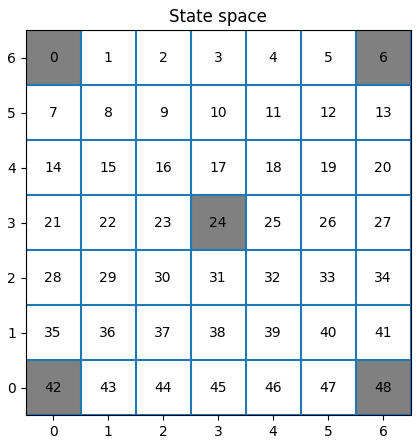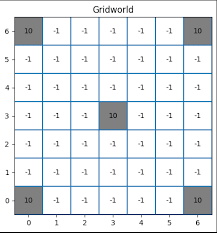

In [1]:
import numpy as np
import matplotlib.pyplot as plt

In [2]:
size = 4  # 4x4 grid
n_steps = 3
n_trials = 3
epsilons = [0.1, 0.3, 0.5]

In [3]:
stochastic_policy_rewards = np.zeros((len(epsilons), n_steps))
deterministic_policy_rewards = np.zeros((len(epsilons), n_steps))


In [4]:
def epsilon_greedy(Q, epsilon):
    if np.random.uniform()<epsilon:
        return np.random.randint(len(Q))
    else:
        return np.argmax(Q)

def greedy(Q):
    return np.argmax(Q)

In [ ]:
# The Gridworld class is initialized with a size parameter, which defines the dimensions of the grid.
# The start_state is set to the top-left corner of the grid (0, 0).
# The goal_state is set to the bottom-right corner of the grid (size - 1, size - 1).
# The current_state is initialized to the start_state

In [5]:
class Gridworld: # environment
    def __init__(self, size):
        self.size = size
        self.start_state = (0,0)
        self.goal_state = (size -1, size-1)
        self.current_state = self.start_state
        
    def step (self, action):
        if action == 0:
            self.current_state = (self.current_state[0], min(self.current_state[1]+1, self.size-1))
        elif action == 1:
            self.current_state = (max(self.current_state[0]-1,0), self.current_state[1])
        elif action == 2:
            self.current_state = (self.current_state[0], max(self.current_state[1]-1,0))
        else:
            self.current_state = (min(self.current_state[0]+1, self.size-1), self.current_state[1])
        
        if self.current_state == self.goal_state:
            return 1, self.goal_state
        else:
            return 0, self.current_state

In [ ]:
# The step function takes an action as input and updates the current_state accordingly.
# The action is an integer between 0 and 3, representing the four possible movements:
# Action 0: Move right
# Action 1: Move up
# Action 2: Move left
# Action 3: Move down

In [ ]:
# If the agent reaches the goal_state, it receives a reward of 1 and the episode ends.
# Otherwise, the agent receives a reward of 0, and the episode continues with the updated current_state.

In [6]:
size = 4  # 4x4 grid
n_steps = 3
n_trials = 3
epsilons = [0.1, 0.3, 0.5]

In [7]:
Q = np.zeros((size, size, 4))

In [8]:
Q

array([[[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]]])

In [9]:
def epsilon_greedy(Q, epsilon):
    if np.random.uniform()<epsilon:
        return np.random.randint(len(Q))
    else:
        return np.argmax(Q)

def greedy(Q):
    return np.argmax(Q)

In [10]:
gridworld = Gridworld(size)

In [11]:
gridworld.current_state

(0, 0)

In [34]:
Q[gridworld.current_state][0]

np.float64(0.0)

In [37]:
epsilon = 0.1

In [14]:
action = epsilon_greedy(Q[gridworld.current_state], 0.1)

In [15]:
action

np.int64(0)

In [22]:
rand = np.random.uniform()

In [28]:
rand

0.563091559698538

In [32]:
Q

array([[[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]]])

In [30]:
if rand<0.1:
        action = np.random.randint(len(Q))
        print("x")
else:
    print("y")
    action = np.argmax(Q)

y


In [31]:
action

np.int64(0)

In [19]:
reward, next_state = gridworld.step(action)

In [20]:
reward

0

In [21]:
next_state

(0, 1)

In [35]:
Q[gridworld.current_state][action]

np.float64(0.0)

In [39]:
i =0
epsilon = 0.1

In [42]:
for j in range(n_trials):
        gridworld = Gridworld(size)
        Q = np.zeros((size, size, 4))
        total_reward = 0
        rewards = np.zeros(n_steps)
        
        for step in range(n_steps):
            action = epsilon_greedy(Q[gridworld.current_state], epsilon)
            print('action', action)
            reward, next_state = gridworld.step(action)
            print("reward", reward, "next_state", next_state)
            total_reward += reward
            print('total_reward', total_reward)
            rewards[step] = total_reward
            print('rewards', rewards)
            Q[gridworld.current_state][action] += (reward - Q[gridworld.current_state][action])/ (j+1)
            print('Q', Q[gridworld.current_state][action] ,Q)
            
        stochastic_policy_rewards[i] += rewards/n_trials
        print('stochastic_policy_rewards', stochastic_policy_rewards)


action 0
reward 0 next_state (0, 1)
total_reward 0
rewards [0. 0. 0.]
Q 0.0 [[[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]

 [[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]

 [[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]

 [[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]]
action 0
reward 0 next_state (0, 2)
total_reward 0
rewards [0. 0. 0.]
Q 0.0 [[[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]

 [[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]

 [[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]

 [[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]]
action 0
reward 0 next_state (0, 3)
total_reward 0
rewards [0. 0. 0.]
Q 0.0 [[[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]

 [[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]

 [[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]

 [[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.

In [74]:
size = 4  # 4x4 grid
n_steps = 50
n_trials = 50
epsilons = [0.1, 0.3, 0.5]

In [75]:
stochastic_policy_rewards = np.zeros((len(epsilons), n_steps)) # 3x50
deterministic_policy_rewards = np.zeros((len(epsilons), n_steps)) #3x50

In [63]:
class Gridworld: # environment which remembers the current state and goal state
    def __init__(self, size):
        self.size = size
        self.start_state = (0,0)
        self.goal_state = (size -1, size-1)
        self.current_state = self.start_state
        
    def step (self, action):
        if action == 0:
            self.current_state = (self.current_state[0], min(self.current_state[1]+1, self.size-1))
        elif action == 1:
            self.current_state = (max(self.current_state[0]-1,0), self.current_state[1])
        elif action == 2:
            self.current_state = (self.current_state[0], max(self.current_state[1]-1,0))
        else:
            self.current_state = (min(self.current_state[0]+1, self.size-1), self.current_state[1])
        
        if self.current_state == self.goal_state:
            return 1, self.goal_state  # reward = 1 for reaching goal state
        else:
            return 0, self.current_state    # reward = 0 for not reaching the goal



In [64]:
def epsilon_greedy(Q, epsilon):
    if np.random.uniform()<epsilon:
        return np.random.randint(len(Q))
    else:
        return np.argmax(Q)

In [65]:
def greedy(Q):
    return np.argmax(Q)

In [ ]:
# This code is comparing the performance of two different policies in a gridworld environment:
# Policies:
# Epsilon-Greedy Policy: This policy chooses the greedy action (i.e., the action with the highest estimated reward) with probability (1 - epsilon) and chooses a random action with probability epsilon.
# Greedy Policy: This policy always chooses the action with the highest estimated reward.
# Simulation:
# The code runs multiple trials for each policy, and in each trial:
# It initializes a gridworld environment with a specified size.
# It creates a Q-table to store the estimated rewards for each state-action pair.
# It runs the policy for a specified number of steps.
# At each step, it selects an action according to the policy, takes the action in the gridworld, and receives a reward.
# It updates the Q-table using the received reward and the selected action.
# It stores the cumulative reward at each step.

In [84]:
for i, epsilon in enumerate(epsilons):
    print('epsilon', epsilon)
    for j in range(n_trials):
        
        gridworld = Gridworld(size)
        Q = np.zeros((size, size, 4))
        total_reward = 0
        rewards = np.zeros(n_steps)
        
        for step in range(n_steps):
            action = epsilon_greedy(Q[gridworld.current_state], epsilon)
            print('action', action)
            reward, next_state = gridworld.step(action) # reward = 0 for not reaching the goal or 1 for reaching the goal
            print("reward", reward, "next_state", next_state)
            total_reward += reward
            print('total_reward', total_reward)
            rewards[step] = total_reward
            print('rewards', rewards)
            Q[gridworld.current_state][action] += (reward - Q[gridworld.current_state][action])/ (j+1)
            print('Q', Q[gridworld.current_state][action] ,Q)

        print('n_trials', j)
        stochastic_policy_rewards[i] += rewards/n_trials
        print('stochastic_policy_rewards', stochastic_policy_rewards)

    for j in range(n_trials):
        gridworld = Gridworld(size)
        Q = np.zeros((size, size, 4))
        total_reward = 0
        rewards = np.zeros(n_steps)
        
        for step in range(n_steps):
            action = greedy(Q[gridworld.current_state])
            reward, next_state = gridworld.step(action)
            total_reward += reward
            rewards[step] = total_reward
            Q[gridworld.current_state][action] += (reward - Q[gridworld.current_state][action])/ (j+1)
            
        deterministic_policy_rewards[i] += rewards/n_trials




epsilon 0.1
action 0
reward 0 next_state (0, 1)
total_reward 0
rewards [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
Q 0.0 [[[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]

 [[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]

 [[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]

 [[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]]
action 0
reward 0 next_state (0, 2)
total_reward 0
rewards [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
Q 0.0 [[[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]

 [[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]

 [[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]

 [[0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]
  [0. 0. 0. 0.]]]
action 0
reward 0 next

In [ ]:
# Q[gridworld.current_state][action]: This is the current Q-value for the state-action pair.
# (reward - Q[gridworld.current_state][action]): This is the temporal difference (TD) error, which is the difference between the received reward and the expected reward (i.e., the current Q-value).
# /(j+1): This is the learning rate, which controls how quickly the Q-value is updated. In this case, the learning rate is inversely proportional to the trial number j. This means that the Q-value is updated more quickly during early trials and more slowly during later trials.
# Effect:
# The update rule has the following effects:
# Incremental learning: The Q-value is updated incrementally based on the TD error, rather than being replaced entirely.
# Averaging: The learning rate ensures that the Q-value is averaged over multiple trials, reducing the impact of individual rewards.
# Convergence: As the number of trials increases, the Q-value converges to its true value.

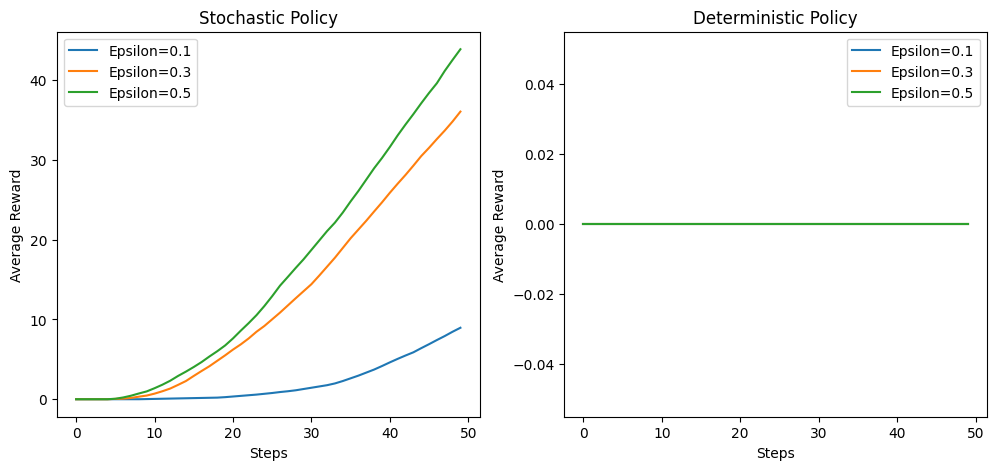

In [85]:

fig, axs = plt.subplots(1, 2, figsize=(12, 5))

for i, epsilon in enumerate(epsilons):
    axs[0].plot(stochastic_policy_rewards[i], label="Epsilon={}".format(epsilon))
    axs[1].plot(deterministic_policy_rewards[i], label="Epsilon={}".format(epsilon))

axs[0].set_title('Stochastic Policy')
axs[0].set_xlabel('Steps')
axs[0].set_ylabel('Average Reward')
axs[0].legend()

axs[1].set_title('Deterministic Policy')
axs[1].set_xlabel('Steps')
axs[1].set_ylabel('Average Reward')
axs[1].legend()
plt.show()

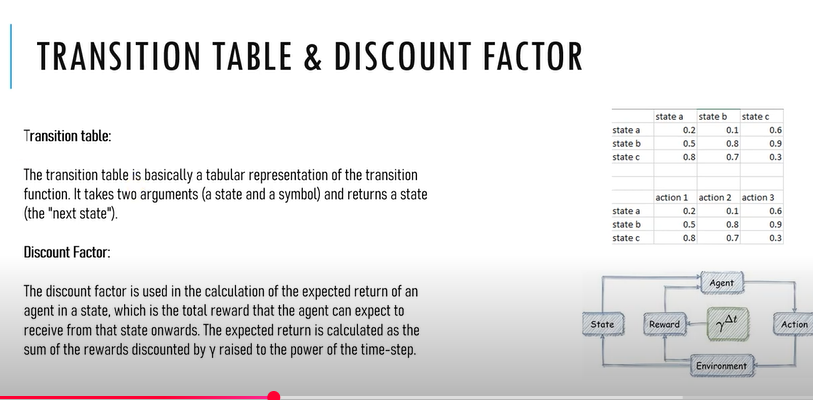

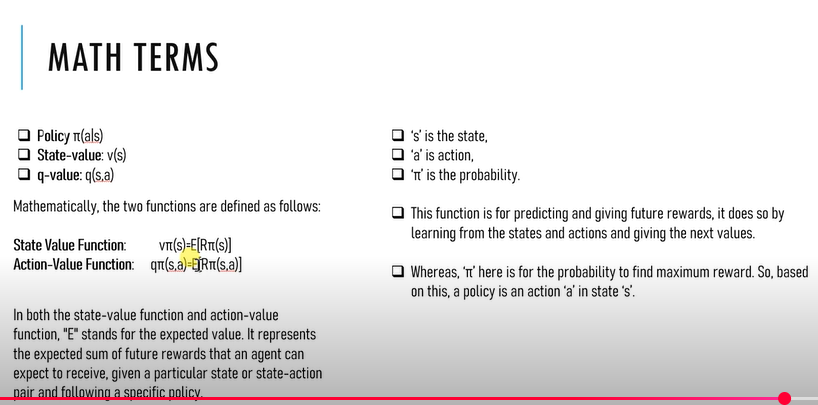

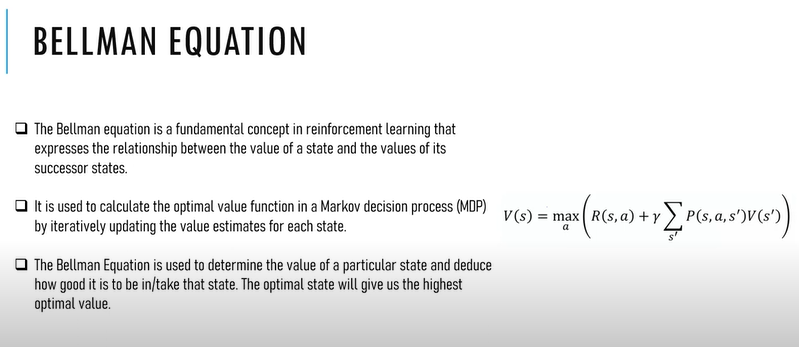

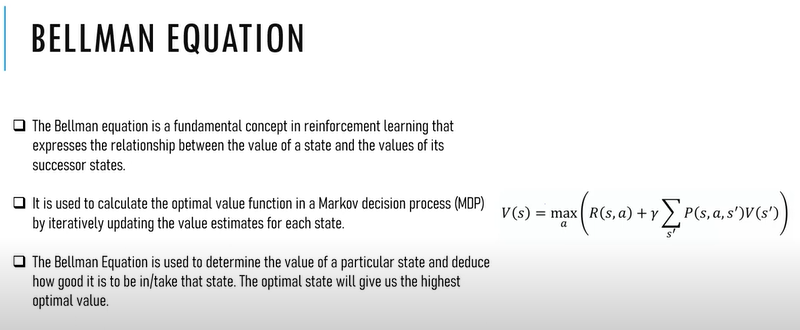

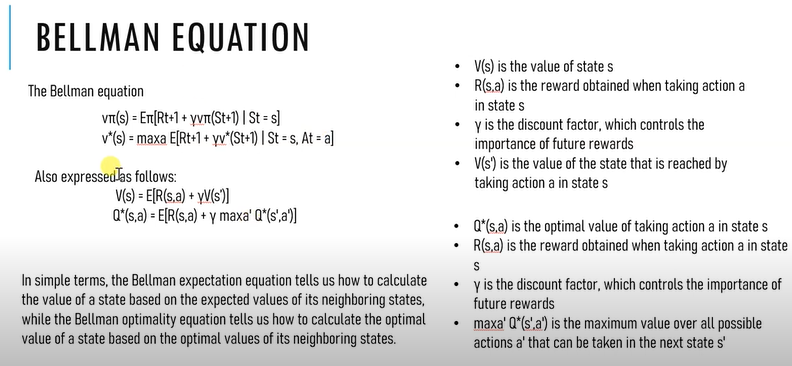

In [86]:
def reward(state, action):
    if state==0 and state == 1:
        return 1
    elif state == 3 and action ==1:
        return 5
    else:
        return 0

In [87]:
#value fn
value = np.zeros((4,2))
gamma = 0.9

In [88]:
value

array([[0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.]])

In [89]:
new_value = np.zeros_like(value)

In [91]:
new_value  # state x action

array([[0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.]])

In [92]:
value.shape[0] # no of states

4

In [101]:
state = 0

In [93]:
max_value = -np.inf

In [94]:
max_value # -infinity

-inf

In [95]:
value.shape[1] # actions

2

In [96]:
action = 0

In [97]:
action_value = 0

In [98]:
next_state = 0

In [102]:
if state==0 and action == 1 and next_state==1:
    transition_prob =  1
elif state == 3 and action == 0 and next_state ==2:
    transition_prob =1
elif state == next_state:
    transition_prob= 0.5
else:
    transition_prob =0

In [104]:
transition_prob

0.5

In [132]:
if state==0 and action == 1:
    reward =  1
elif state == 3 and action ==1:
    reward =  5
else:
    reward = 0

In [105]:
reward

0

In [106]:
value

array([[0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.]])

In [108]:
value[next_state, :] # 0 :

array([0., 0.])

In [109]:
value[next_state, :].max()

np.float64(0.0)

In [110]:
action_value += transition_prob * reward + gamma * value[next_state, :].max() # gamma represents the importance of next state

In [111]:
action_value # reward

np.float64(0.0)

In [112]:
max_value = max(max_value, action_value)

In [113]:
max_value

np.float64(0.0)

In [114]:
new_value[state, action] = action_value

In [115]:
new_value

array([[0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.]])

In [137]:
def reward(state, action):
    if state==0 and action == 1:
        return 1
    elif state == 3 and action ==1:
        return 5
    else:
        return 0
    
    
def transition_prob(state, action, next_state):
    if state==0 and action == 1 and next_state==1:
        return 1
    elif state == 3 and action == 0 and next_state ==2:
        return 1
    elif state == next_state:
        return 0.5
    else:
        return 0

In [145]:
def bellman_eqn(value, gamma):
    new_value = np.zeros_like(value)
    print("new_value: ", new_value)
    for state in range(value.shape[0]):
        print("state = ", state)
        max_value = -np.inf
        for action in range(value.shape[1]):
            print("action = ", action)
            action_value = 0
            for next_state in range(value.shape[0]):
                print("next_state = ", next_state)
                print("transition_prob = ", transition_prob(state, action, next_state))
                print("reward = ", reward(state, action))
                action_value += transition_prob(state, action, next_state) * (reward(state, action) + gamma * value[next_state, :].max())
                # poliyc value
                print('Action Value:', action_value)
                max_value = max(max_value, action_value)
                print('Max Value:', max_value)
                new_value[state, action] = action_value
                print(state, action)
                print('New Value:', new_value[state, action])

                
            print('New Value Function:', new_value)
            plt.plot(new_value.flatten())
            plt.xlabel('State-action pairs')
            plt.ylabel("Vlaue function")
            plt.show()
    return new_value

In [139]:
def main():
    #value fn
    value = np.zeros((4,2))
    gamma = 0.9
    
    #Compute optimal val function
    for i in range(5):
        value = bellman_eqn(value, gamma)
    
    #print optimal val fn
    print('Optimal Value Function ', value)

new_value:  [[0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]]
state =  0
action =  0
next_state =  0
transition_prob =  0.5
reward =  0
Action Value: 0.0
Max Value: 0.0
0 0
New Value: 0.0
next_state =  1
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
0 0
New Value: 0.0
next_state =  2
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
0 0
New Value: 0.0
next_state =  3
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
0 0
New Value: 0.0
New Value Function: [[0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]]


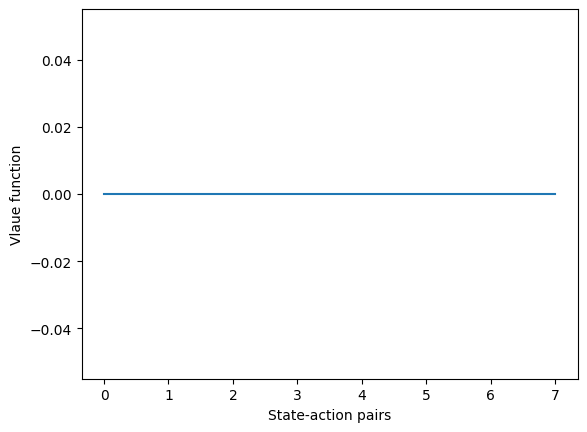

action =  1
next_state =  0
transition_prob =  0.5
reward =  1
Action Value: 0.5
Max Value: 0.5
0 1
New Value: 0.5
next_state =  1
transition_prob =  1
reward =  1
Action Value: 1.5
Max Value: 1.5
0 1
New Value: 1.5
next_state =  2
transition_prob =  0
reward =  1
Action Value: 1.5
Max Value: 1.5
0 1
New Value: 1.5
next_state =  3
transition_prob =  0
reward =  1
Action Value: 1.5
Max Value: 1.5
0 1
New Value: 1.5
New Value Function: [[0.  1.5]
 [0.  0. ]
 [0.  0. ]
 [0.  0. ]]


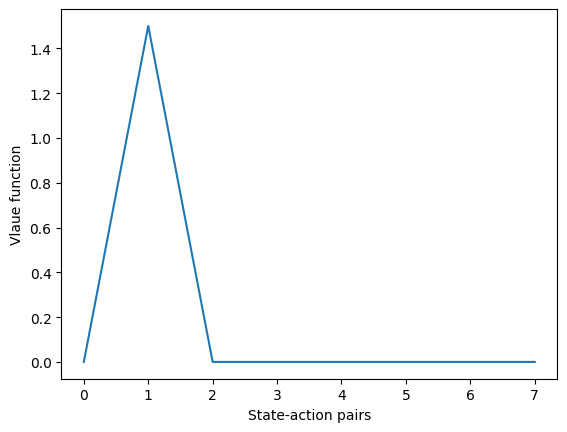

state =  1
action =  0
next_state =  0
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 0
New Value: 0.0
next_state =  1
transition_prob =  0.5
reward =  0
Action Value: 0.0
Max Value: 0.0
1 0
New Value: 0.0
next_state =  2
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 0
New Value: 0.0
next_state =  3
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 0
New Value: 0.0
New Value Function: [[0.  1.5]
 [0.  0. ]
 [0.  0. ]
 [0.  0. ]]


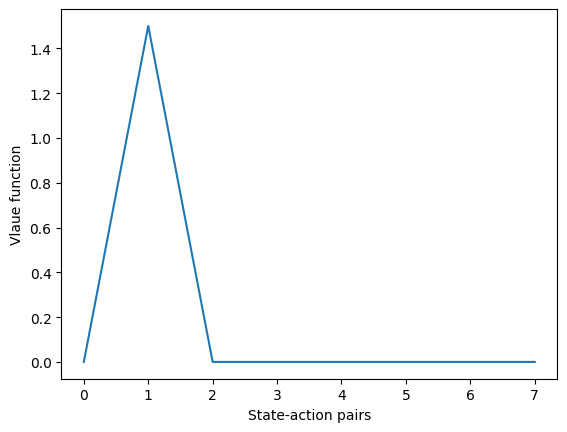

action =  1
next_state =  0
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 1
New Value: 0.0
next_state =  1
transition_prob =  0.5
reward =  0
Action Value: 0.0
Max Value: 0.0
1 1
New Value: 0.0
next_state =  2
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 1
New Value: 0.0
next_state =  3
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 1
New Value: 0.0
New Value Function: [[0.  1.5]
 [0.  0. ]
 [0.  0. ]
 [0.  0. ]]


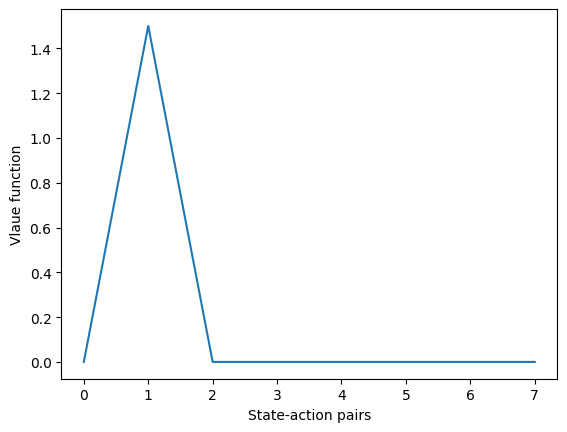

state =  2
action =  0
next_state =  0
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 0
New Value: 0.0
next_state =  1
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 0
New Value: 0.0
next_state =  2
transition_prob =  0.5
reward =  0
Action Value: 0.0
Max Value: 0.0
2 0
New Value: 0.0
next_state =  3
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 0
New Value: 0.0
New Value Function: [[0.  1.5]
 [0.  0. ]
 [0.  0. ]
 [0.  0. ]]


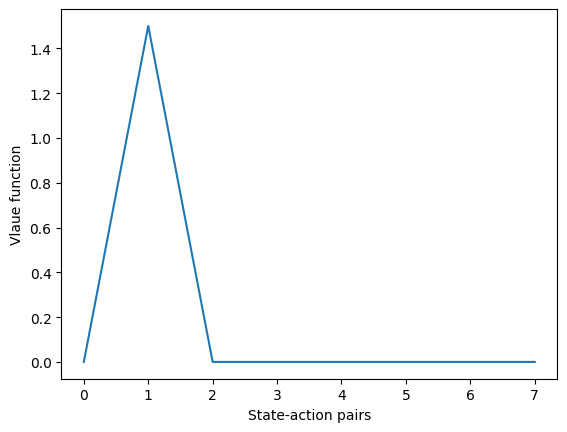

action =  1
next_state =  0
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 1
New Value: 0.0
next_state =  1
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 1
New Value: 0.0
next_state =  2
transition_prob =  0.5
reward =  0
Action Value: 0.0
Max Value: 0.0
2 1
New Value: 0.0
next_state =  3
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 1
New Value: 0.0
New Value Function: [[0.  1.5]
 [0.  0. ]
 [0.  0. ]
 [0.  0. ]]


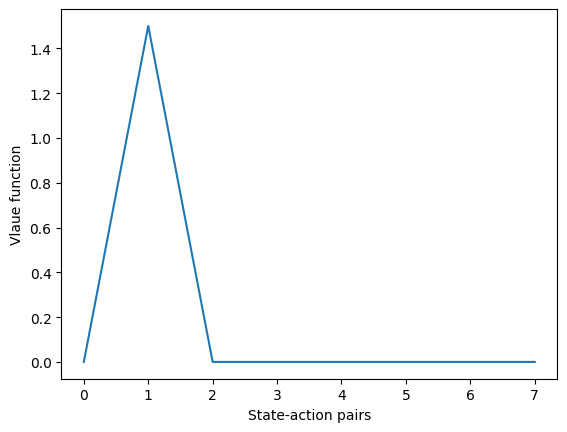

state =  3
action =  0
next_state =  0
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
3 0
New Value: 0.0
next_state =  1
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
3 0
New Value: 0.0
next_state =  2
transition_prob =  1
reward =  0
Action Value: 0.0
Max Value: 0.0
3 0
New Value: 0.0
next_state =  3
transition_prob =  0.5
reward =  0
Action Value: 0.0
Max Value: 0.0
3 0
New Value: 0.0
New Value Function: [[0.  1.5]
 [0.  0. ]
 [0.  0. ]
 [0.  0. ]]


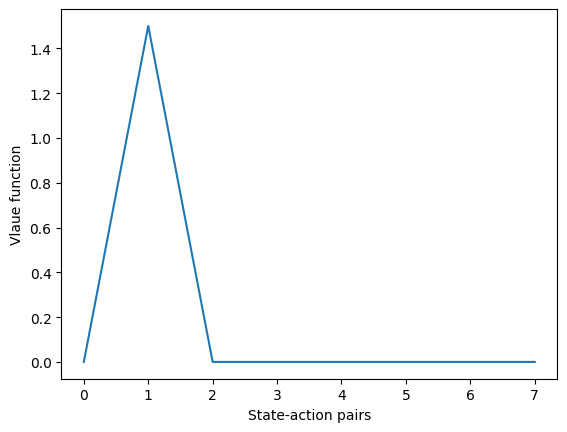

action =  1
next_state =  0
transition_prob =  0
reward =  5
Action Value: 0.0
Max Value: 0.0
3 1
New Value: 0.0
next_state =  1
transition_prob =  0
reward =  5
Action Value: 0.0
Max Value: 0.0
3 1
New Value: 0.0
next_state =  2
transition_prob =  0
reward =  5
Action Value: 0.0
Max Value: 0.0
3 1
New Value: 0.0
next_state =  3
transition_prob =  0.5
reward =  5
Action Value: 2.5
Max Value: 2.5
3 1
New Value: 2.5
New Value Function: [[0.  1.5]
 [0.  0. ]
 [0.  0. ]
 [0.  2.5]]


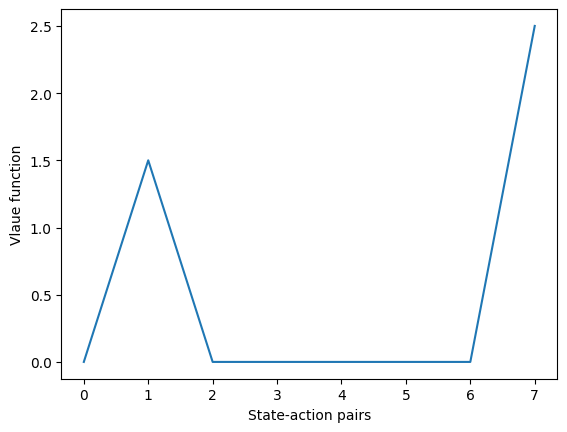

new_value:  [[0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]]
state =  0
action =  0
next_state =  0
transition_prob =  0.5
reward =  0
Action Value: 0.675
Max Value: 0.675
0 0
New Value: 0.675
next_state =  1
transition_prob =  0
reward =  0
Action Value: 0.675
Max Value: 0.675
0 0
New Value: 0.675
next_state =  2
transition_prob =  0
reward =  0
Action Value: 0.675
Max Value: 0.675
0 0
New Value: 0.675
next_state =  3
transition_prob =  0
reward =  0
Action Value: 0.675
Max Value: 0.675
0 0
New Value: 0.675
New Value Function: [[0.675 0.   ]
 [0.    0.   ]
 [0.    0.   ]
 [0.    0.   ]]


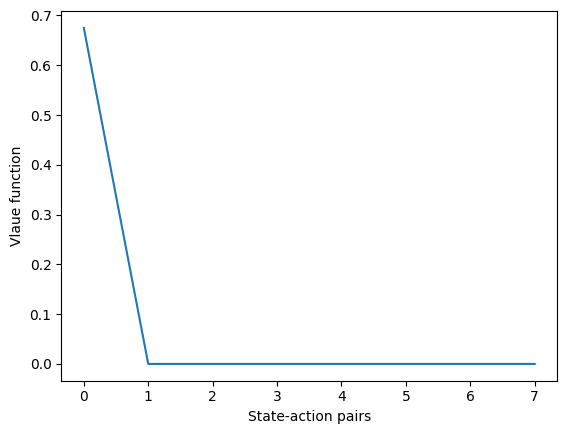

action =  1
next_state =  0
transition_prob =  0.5
reward =  1
Action Value: 1.175
Max Value: 1.175
0 1
New Value: 1.175
next_state =  1
transition_prob =  1
reward =  1
Action Value: 2.175
Max Value: 2.175
0 1
New Value: 2.175
next_state =  2
transition_prob =  0
reward =  1
Action Value: 2.175
Max Value: 2.175
0 1
New Value: 2.175
next_state =  3
transition_prob =  0
reward =  1
Action Value: 2.175
Max Value: 2.175
0 1
New Value: 2.175
New Value Function: [[0.675 2.175]
 [0.    0.   ]
 [0.    0.   ]
 [0.    0.   ]]


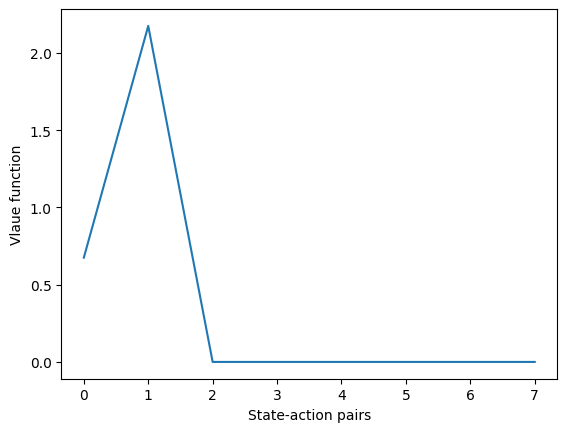

state =  1
action =  0
next_state =  0
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 0
New Value: 0.0
next_state =  1
transition_prob =  0.5
reward =  0
Action Value: 0.0
Max Value: 0.0
1 0
New Value: 0.0
next_state =  2
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 0
New Value: 0.0
next_state =  3
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 0
New Value: 0.0
New Value Function: [[0.675 2.175]
 [0.    0.   ]
 [0.    0.   ]
 [0.    0.   ]]


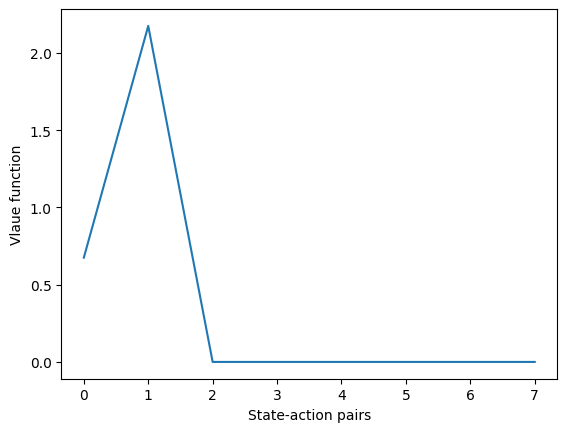

action =  1
next_state =  0
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 1
New Value: 0.0
next_state =  1
transition_prob =  0.5
reward =  0
Action Value: 0.0
Max Value: 0.0
1 1
New Value: 0.0
next_state =  2
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 1
New Value: 0.0
next_state =  3
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 1
New Value: 0.0
New Value Function: [[0.675 2.175]
 [0.    0.   ]
 [0.    0.   ]
 [0.    0.   ]]


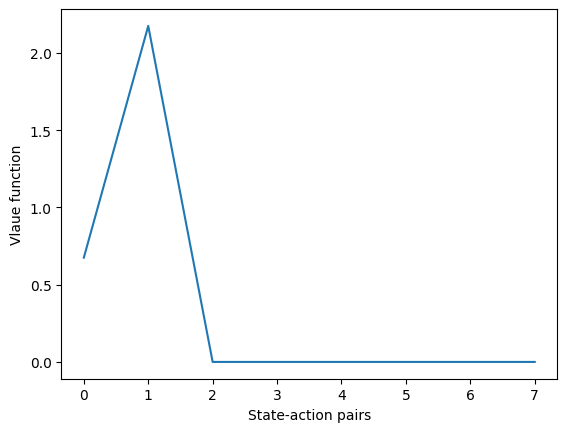

state =  2
action =  0
next_state =  0
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 0
New Value: 0.0
next_state =  1
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 0
New Value: 0.0
next_state =  2
transition_prob =  0.5
reward =  0
Action Value: 0.0
Max Value: 0.0
2 0
New Value: 0.0
next_state =  3
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 0
New Value: 0.0
New Value Function: [[0.675 2.175]
 [0.    0.   ]
 [0.    0.   ]
 [0.    0.   ]]


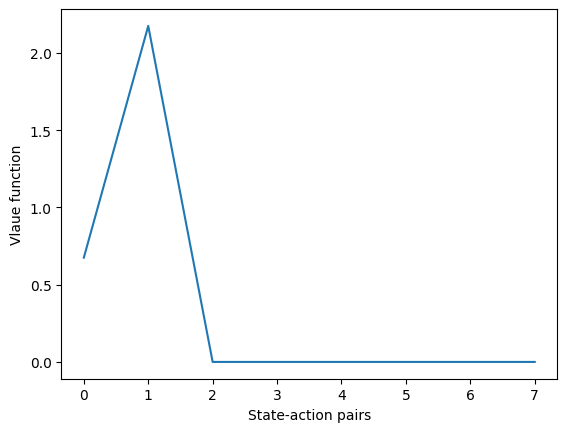

action =  1
next_state =  0
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 1
New Value: 0.0
next_state =  1
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 1
New Value: 0.0
next_state =  2
transition_prob =  0.5
reward =  0
Action Value: 0.0
Max Value: 0.0
2 1
New Value: 0.0
next_state =  3
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 1
New Value: 0.0
New Value Function: [[0.675 2.175]
 [0.    0.   ]
 [0.    0.   ]
 [0.    0.   ]]


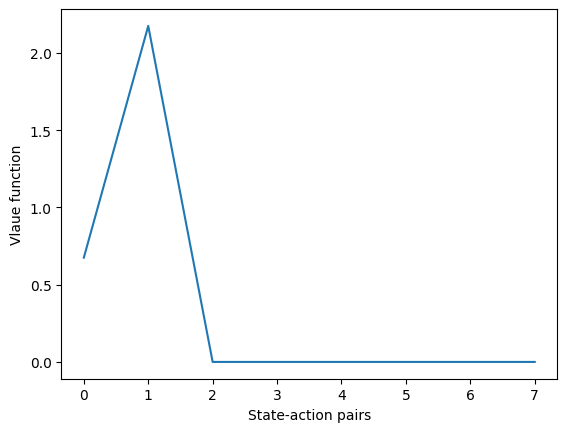

state =  3
action =  0
next_state =  0
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
3 0
New Value: 0.0
next_state =  1
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
3 0
New Value: 0.0
next_state =  2
transition_prob =  1
reward =  0
Action Value: 0.0
Max Value: 0.0
3 0
New Value: 0.0
next_state =  3
transition_prob =  0.5
reward =  0
Action Value: 1.125
Max Value: 1.125
3 0
New Value: 1.125
New Value Function: [[0.675 2.175]
 [0.    0.   ]
 [0.    0.   ]
 [1.125 0.   ]]


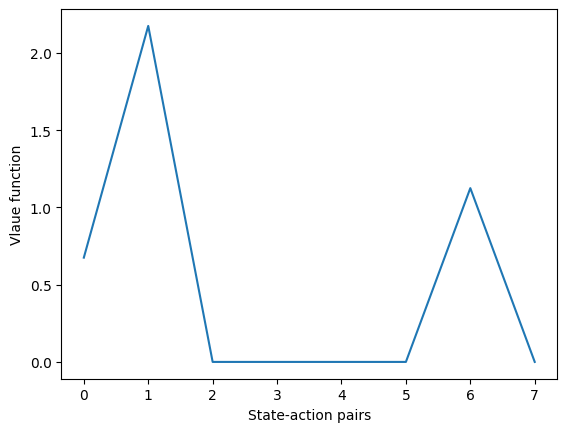

action =  1
next_state =  0
transition_prob =  0
reward =  5
Action Value: 0.0
Max Value: 1.125
3 1
New Value: 0.0
next_state =  1
transition_prob =  0
reward =  5
Action Value: 0.0
Max Value: 1.125
3 1
New Value: 0.0
next_state =  2
transition_prob =  0
reward =  5
Action Value: 0.0
Max Value: 1.125
3 1
New Value: 0.0
next_state =  3
transition_prob =  0.5
reward =  5
Action Value: 3.625
Max Value: 3.625
3 1
New Value: 3.625
New Value Function: [[0.675 2.175]
 [0.    0.   ]
 [0.    0.   ]
 [1.125 3.625]]


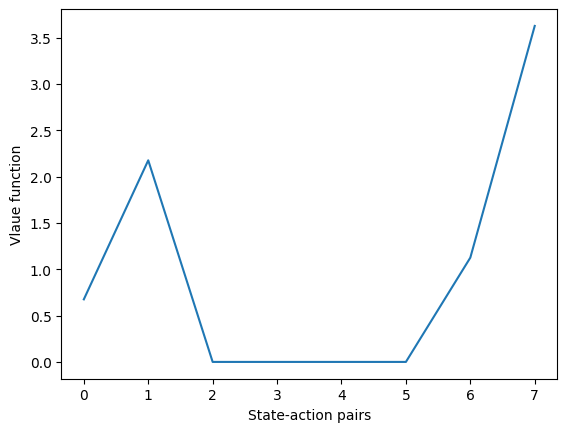

new_value:  [[0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]]
state =  0
action =  0
next_state =  0
transition_prob =  0.5
reward =  0
Action Value: 0.9787499999999999
Max Value: 0.9787499999999999
0 0
New Value: 0.9787499999999999
next_state =  1
transition_prob =  0
reward =  0
Action Value: 0.9787499999999999
Max Value: 0.9787499999999999
0 0
New Value: 0.9787499999999999
next_state =  2
transition_prob =  0
reward =  0
Action Value: 0.9787499999999999
Max Value: 0.9787499999999999
0 0
New Value: 0.9787499999999999
next_state =  3
transition_prob =  0
reward =  0
Action Value: 0.9787499999999999
Max Value: 0.9787499999999999
0 0
New Value: 0.9787499999999999
New Value Function: [[0.97875 0.     ]
 [0.      0.     ]
 [0.      0.     ]
 [0.      0.     ]]


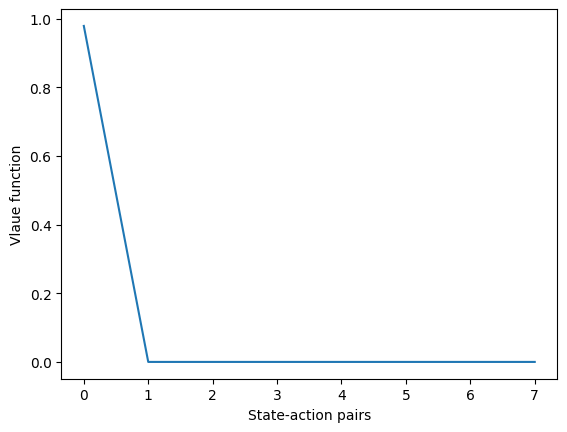

action =  1
next_state =  0
transition_prob =  0.5
reward =  1
Action Value: 1.4787499999999998
Max Value: 1.4787499999999998
0 1
New Value: 1.4787499999999998
next_state =  1
transition_prob =  1
reward =  1
Action Value: 2.47875
Max Value: 2.47875
0 1
New Value: 2.47875
next_state =  2
transition_prob =  0
reward =  1
Action Value: 2.47875
Max Value: 2.47875
0 1
New Value: 2.47875
next_state =  3
transition_prob =  0
reward =  1
Action Value: 2.47875
Max Value: 2.47875
0 1
New Value: 2.47875
New Value Function: [[0.97875 2.47875]
 [0.      0.     ]
 [0.      0.     ]
 [0.      0.     ]]


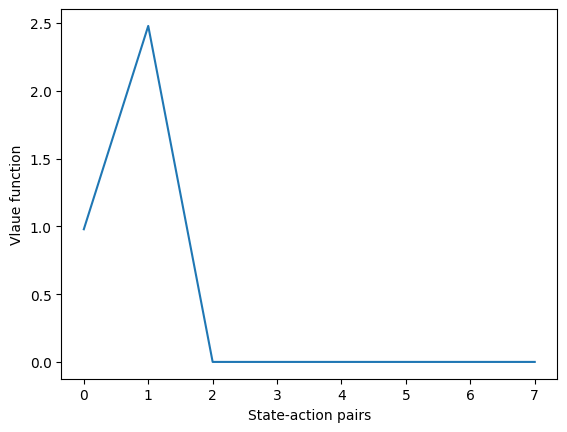

state =  1
action =  0
next_state =  0
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 0
New Value: 0.0
next_state =  1
transition_prob =  0.5
reward =  0
Action Value: 0.0
Max Value: 0.0
1 0
New Value: 0.0
next_state =  2
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 0
New Value: 0.0
next_state =  3
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 0
New Value: 0.0
New Value Function: [[0.97875 2.47875]
 [0.      0.     ]
 [0.      0.     ]
 [0.      0.     ]]


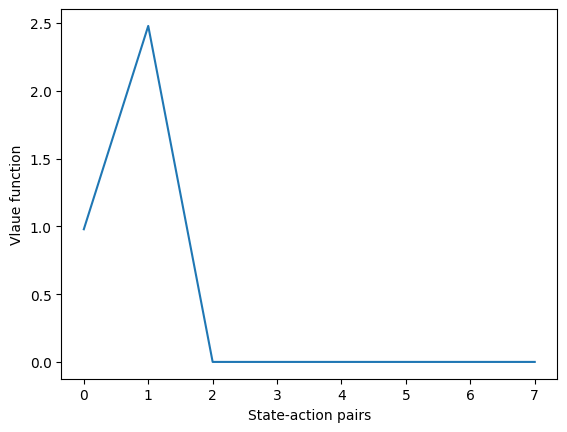

action =  1
next_state =  0
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 1
New Value: 0.0
next_state =  1
transition_prob =  0.5
reward =  0
Action Value: 0.0
Max Value: 0.0
1 1
New Value: 0.0
next_state =  2
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 1
New Value: 0.0
next_state =  3
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 1
New Value: 0.0
New Value Function: [[0.97875 2.47875]
 [0.      0.     ]
 [0.      0.     ]
 [0.      0.     ]]


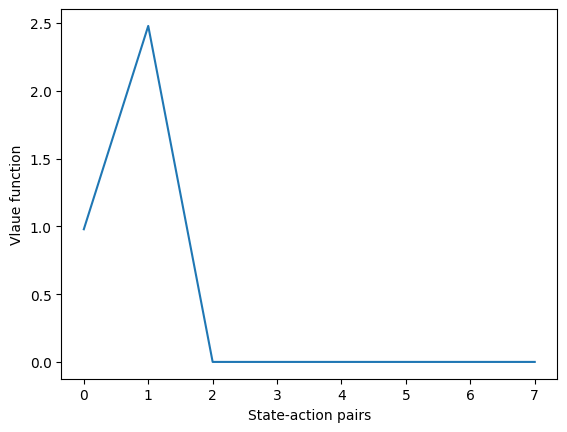

state =  2
action =  0
next_state =  0
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 0
New Value: 0.0
next_state =  1
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 0
New Value: 0.0
next_state =  2
transition_prob =  0.5
reward =  0
Action Value: 0.0
Max Value: 0.0
2 0
New Value: 0.0
next_state =  3
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 0
New Value: 0.0
New Value Function: [[0.97875 2.47875]
 [0.      0.     ]
 [0.      0.     ]
 [0.      0.     ]]


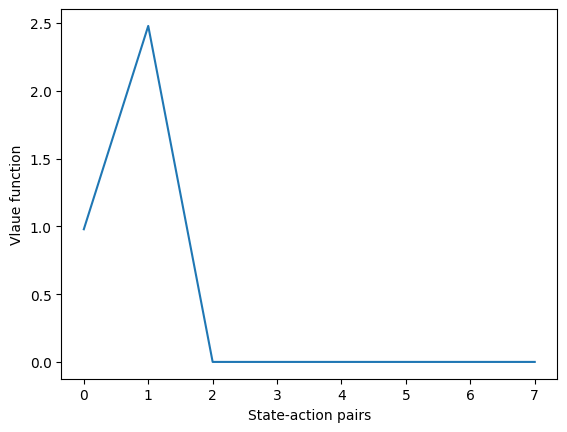

action =  1
next_state =  0
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 1
New Value: 0.0
next_state =  1
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 1
New Value: 0.0
next_state =  2
transition_prob =  0.5
reward =  0
Action Value: 0.0
Max Value: 0.0
2 1
New Value: 0.0
next_state =  3
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 1
New Value: 0.0
New Value Function: [[0.97875 2.47875]
 [0.      0.     ]
 [0.      0.     ]
 [0.      0.     ]]


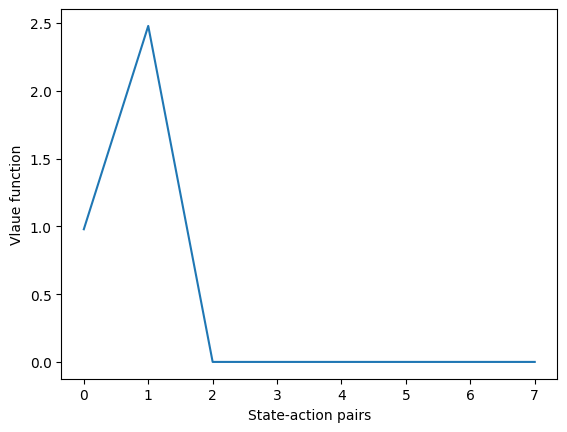

state =  3
action =  0
next_state =  0
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
3 0
New Value: 0.0
next_state =  1
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
3 0
New Value: 0.0
next_state =  2
transition_prob =  1
reward =  0
Action Value: 0.0
Max Value: 0.0
3 0
New Value: 0.0
next_state =  3
transition_prob =  0.5
reward =  0
Action Value: 1.63125
Max Value: 1.63125
3 0
New Value: 1.63125
New Value Function: [[0.97875 2.47875]
 [0.      0.     ]
 [0.      0.     ]
 [1.63125 0.     ]]


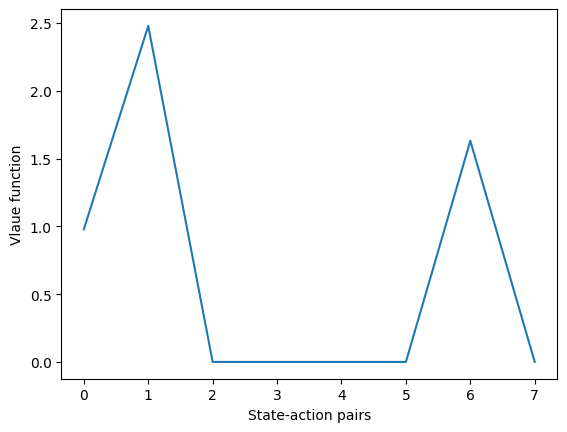

action =  1
next_state =  0
transition_prob =  0
reward =  5
Action Value: 0.0
Max Value: 1.63125
3 1
New Value: 0.0
next_state =  1
transition_prob =  0
reward =  5
Action Value: 0.0
Max Value: 1.63125
3 1
New Value: 0.0
next_state =  2
transition_prob =  0
reward =  5
Action Value: 0.0
Max Value: 1.63125
3 1
New Value: 0.0
next_state =  3
transition_prob =  0.5
reward =  5
Action Value: 4.13125
Max Value: 4.13125
3 1
New Value: 4.13125
New Value Function: [[0.97875 2.47875]
 [0.      0.     ]
 [0.      0.     ]
 [1.63125 4.13125]]


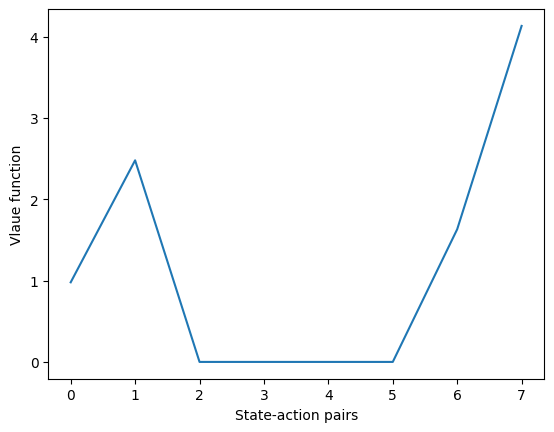

new_value:  [[0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]]
state =  0
action =  0
next_state =  0
transition_prob =  0.5
reward =  0
Action Value: 1.1154374999999999
Max Value: 1.1154374999999999
0 0
New Value: 1.1154374999999999
next_state =  1
transition_prob =  0
reward =  0
Action Value: 1.1154374999999999
Max Value: 1.1154374999999999
0 0
New Value: 1.1154374999999999
next_state =  2
transition_prob =  0
reward =  0
Action Value: 1.1154374999999999
Max Value: 1.1154374999999999
0 0
New Value: 1.1154374999999999
next_state =  3
transition_prob =  0
reward =  0
Action Value: 1.1154374999999999
Max Value: 1.1154374999999999
0 0
New Value: 1.1154374999999999
New Value Function: [[1.1154375 0.       ]
 [0.        0.       ]
 [0.        0.       ]
 [0.        0.       ]]


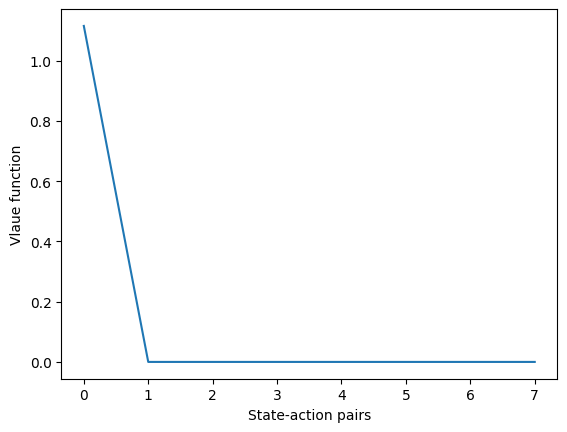

action =  1
next_state =  0
transition_prob =  0.5
reward =  1
Action Value: 1.6154374999999999
Max Value: 1.6154374999999999
0 1
New Value: 1.6154374999999999
next_state =  1
transition_prob =  1
reward =  1
Action Value: 2.6154374999999996
Max Value: 2.6154374999999996
0 1
New Value: 2.6154374999999996
next_state =  2
transition_prob =  0
reward =  1
Action Value: 2.6154374999999996
Max Value: 2.6154374999999996
0 1
New Value: 2.6154374999999996
next_state =  3
transition_prob =  0
reward =  1
Action Value: 2.6154374999999996
Max Value: 2.6154374999999996
0 1
New Value: 2.6154374999999996
New Value Function: [[1.1154375 2.6154375]
 [0.        0.       ]
 [0.        0.       ]
 [0.        0.       ]]


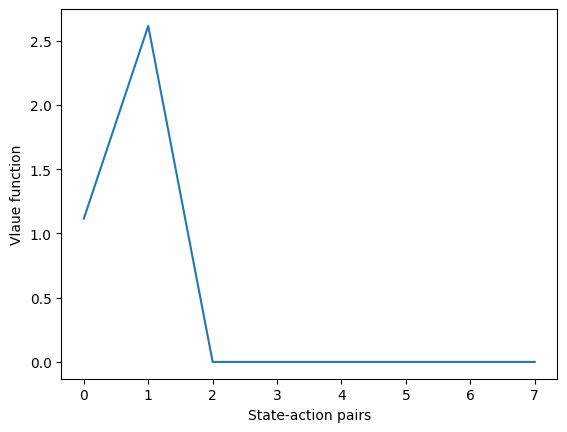

state =  1
action =  0
next_state =  0
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 0
New Value: 0.0
next_state =  1
transition_prob =  0.5
reward =  0
Action Value: 0.0
Max Value: 0.0
1 0
New Value: 0.0
next_state =  2
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 0
New Value: 0.0
next_state =  3
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 0
New Value: 0.0
New Value Function: [[1.1154375 2.6154375]
 [0.        0.       ]
 [0.        0.       ]
 [0.        0.       ]]


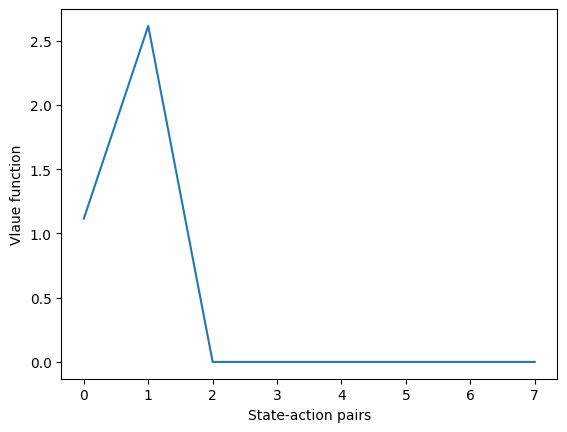

action =  1
next_state =  0
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 1
New Value: 0.0
next_state =  1
transition_prob =  0.5
reward =  0
Action Value: 0.0
Max Value: 0.0
1 1
New Value: 0.0
next_state =  2
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 1
New Value: 0.0
next_state =  3
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 1
New Value: 0.0
New Value Function: [[1.1154375 2.6154375]
 [0.        0.       ]
 [0.        0.       ]
 [0.        0.       ]]


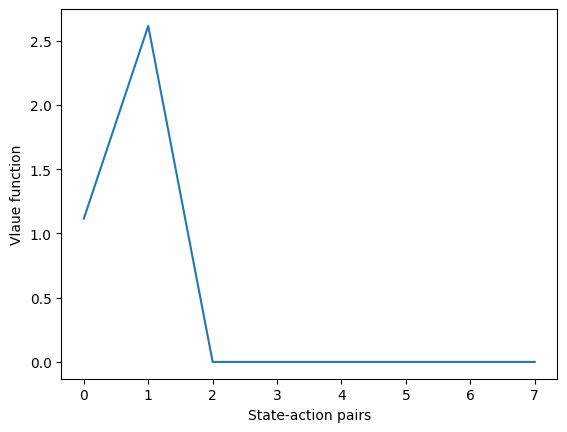

state =  2
action =  0
next_state =  0
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 0
New Value: 0.0
next_state =  1
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 0
New Value: 0.0
next_state =  2
transition_prob =  0.5
reward =  0
Action Value: 0.0
Max Value: 0.0
2 0
New Value: 0.0
next_state =  3
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 0
New Value: 0.0
New Value Function: [[1.1154375 2.6154375]
 [0.        0.       ]
 [0.        0.       ]
 [0.        0.       ]]


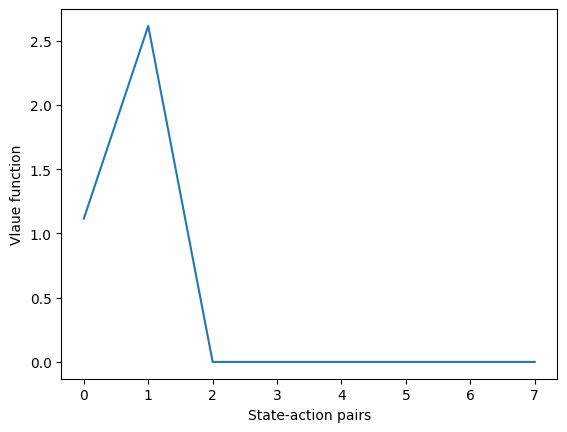

action =  1
next_state =  0
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 1
New Value: 0.0
next_state =  1
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 1
New Value: 0.0
next_state =  2
transition_prob =  0.5
reward =  0
Action Value: 0.0
Max Value: 0.0
2 1
New Value: 0.0
next_state =  3
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 1
New Value: 0.0
New Value Function: [[1.1154375 2.6154375]
 [0.        0.       ]
 [0.        0.       ]
 [0.        0.       ]]


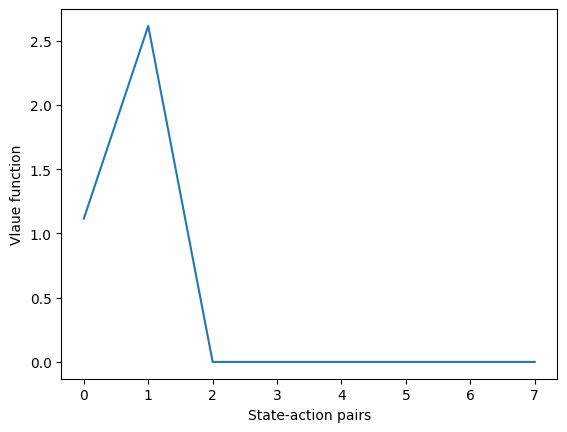

state =  3
action =  0
next_state =  0
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
3 0
New Value: 0.0
next_state =  1
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
3 0
New Value: 0.0
next_state =  2
transition_prob =  1
reward =  0
Action Value: 0.0
Max Value: 0.0
3 0
New Value: 0.0
next_state =  3
transition_prob =  0.5
reward =  0
Action Value: 1.8590624999999998
Max Value: 1.8590624999999998
3 0
New Value: 1.8590624999999998
New Value Function: [[1.1154375 2.6154375]
 [0.        0.       ]
 [0.        0.       ]
 [1.8590625 0.       ]]


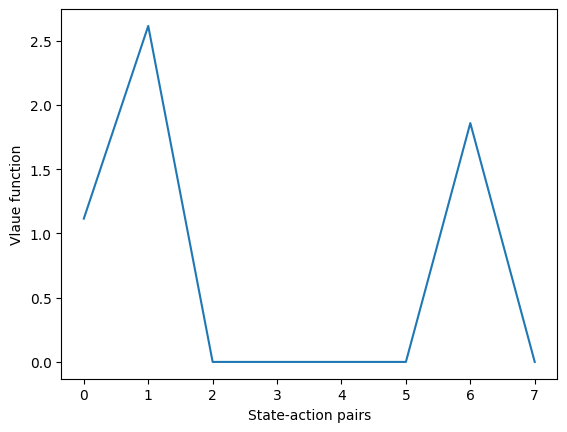

action =  1
next_state =  0
transition_prob =  0
reward =  5
Action Value: 0.0
Max Value: 1.8590624999999998
3 1
New Value: 0.0
next_state =  1
transition_prob =  0
reward =  5
Action Value: 0.0
Max Value: 1.8590624999999998
3 1
New Value: 0.0
next_state =  2
transition_prob =  0
reward =  5
Action Value: 0.0
Max Value: 1.8590624999999998
3 1
New Value: 0.0
next_state =  3
transition_prob =  0.5
reward =  5
Action Value: 4.3590625
Max Value: 4.3590625
3 1
New Value: 4.3590625
New Value Function: [[1.1154375 2.6154375]
 [0.        0.       ]
 [0.        0.       ]
 [1.8590625 4.3590625]]


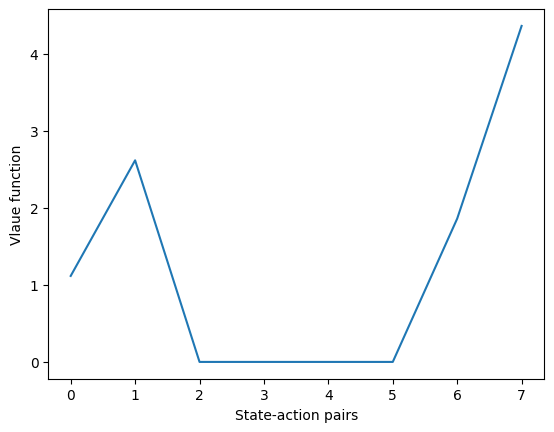

new_value:  [[0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]]
state =  0
action =  0
next_state =  0
transition_prob =  0.5
reward =  0
Action Value: 1.1769468749999998
Max Value: 1.1769468749999998
0 0
New Value: 1.1769468749999998
next_state =  1
transition_prob =  0
reward =  0
Action Value: 1.1769468749999998
Max Value: 1.1769468749999998
0 0
New Value: 1.1769468749999998
next_state =  2
transition_prob =  0
reward =  0
Action Value: 1.1769468749999998
Max Value: 1.1769468749999998
0 0
New Value: 1.1769468749999998
next_state =  3
transition_prob =  0
reward =  0
Action Value: 1.1769468749999998
Max Value: 1.1769468749999998
0 0
New Value: 1.1769468749999998
New Value Function: [[1.17694687 0.        ]
 [0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]]


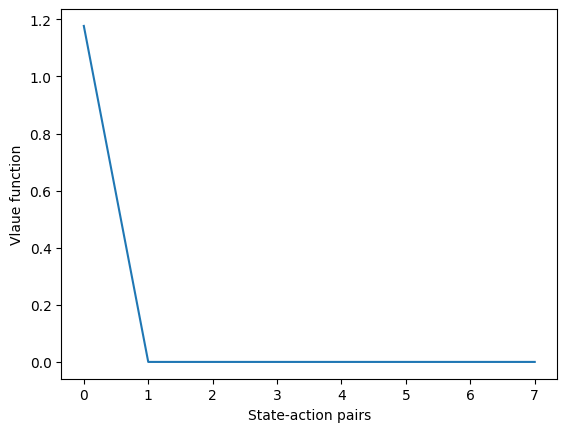

action =  1
next_state =  0
transition_prob =  0.5
reward =  1
Action Value: 1.6769468749999998
Max Value: 1.6769468749999998
0 1
New Value: 1.6769468749999998
next_state =  1
transition_prob =  1
reward =  1
Action Value: 2.6769468749999996
Max Value: 2.6769468749999996
0 1
New Value: 2.6769468749999996
next_state =  2
transition_prob =  0
reward =  1
Action Value: 2.6769468749999996
Max Value: 2.6769468749999996
0 1
New Value: 2.6769468749999996
next_state =  3
transition_prob =  0
reward =  1
Action Value: 2.6769468749999996
Max Value: 2.6769468749999996
0 1
New Value: 2.6769468749999996
New Value Function: [[1.17694687 2.67694687]
 [0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]]


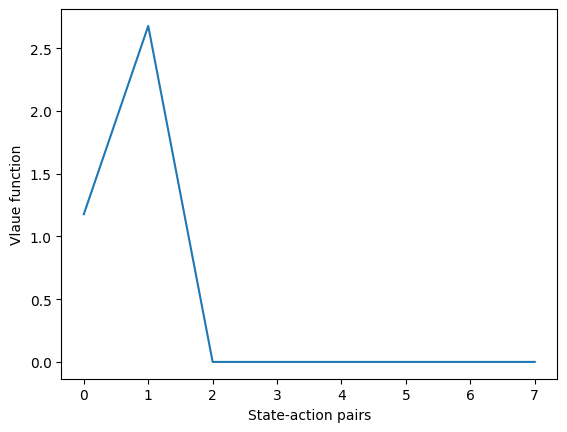

state =  1
action =  0
next_state =  0
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 0
New Value: 0.0
next_state =  1
transition_prob =  0.5
reward =  0
Action Value: 0.0
Max Value: 0.0
1 0
New Value: 0.0
next_state =  2
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 0
New Value: 0.0
next_state =  3
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 0
New Value: 0.0
New Value Function: [[1.17694687 2.67694687]
 [0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]]


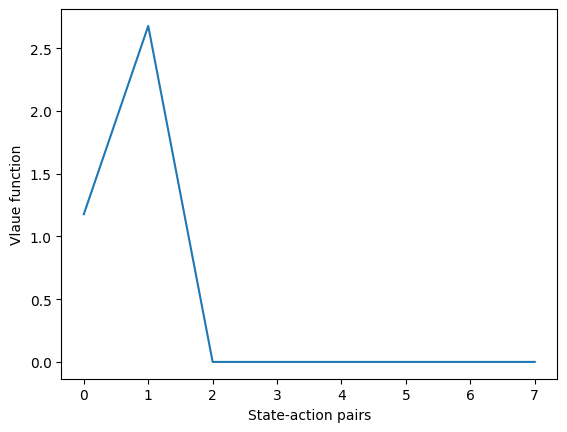

action =  1
next_state =  0
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 1
New Value: 0.0
next_state =  1
transition_prob =  0.5
reward =  0
Action Value: 0.0
Max Value: 0.0
1 1
New Value: 0.0
next_state =  2
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 1
New Value: 0.0
next_state =  3
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
1 1
New Value: 0.0
New Value Function: [[1.17694687 2.67694687]
 [0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]]


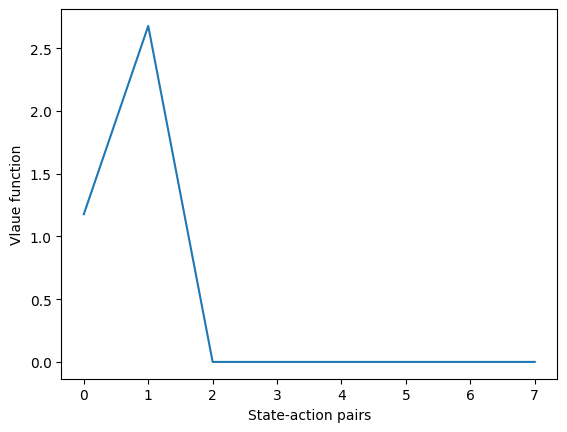

state =  2
action =  0
next_state =  0
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 0
New Value: 0.0
next_state =  1
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 0
New Value: 0.0
next_state =  2
transition_prob =  0.5
reward =  0
Action Value: 0.0
Max Value: 0.0
2 0
New Value: 0.0
next_state =  3
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 0
New Value: 0.0
New Value Function: [[1.17694687 2.67694687]
 [0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]]


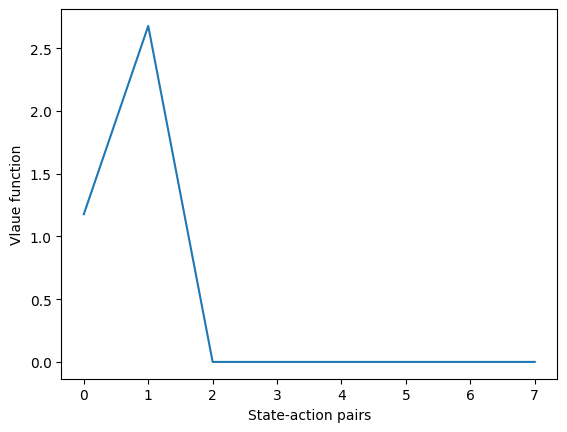

action =  1
next_state =  0
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 1
New Value: 0.0
next_state =  1
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 1
New Value: 0.0
next_state =  2
transition_prob =  0.5
reward =  0
Action Value: 0.0
Max Value: 0.0
2 1
New Value: 0.0
next_state =  3
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
2 1
New Value: 0.0
New Value Function: [[1.17694687 2.67694687]
 [0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]]


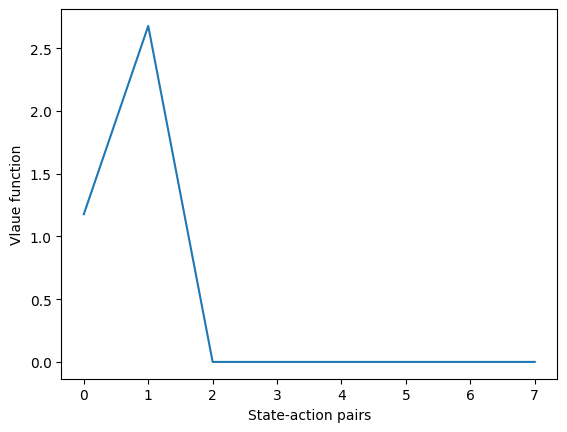

state =  3
action =  0
next_state =  0
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
3 0
New Value: 0.0
next_state =  1
transition_prob =  0
reward =  0
Action Value: 0.0
Max Value: 0.0
3 0
New Value: 0.0
next_state =  2
transition_prob =  1
reward =  0
Action Value: 0.0
Max Value: 0.0
3 0
New Value: 0.0
next_state =  3
transition_prob =  0.5
reward =  0
Action Value: 1.9615781250000002
Max Value: 1.9615781250000002
3 0
New Value: 1.9615781250000002
New Value Function: [[1.17694687 2.67694687]
 [0.         0.        ]
 [0.         0.        ]
 [1.96157813 0.        ]]


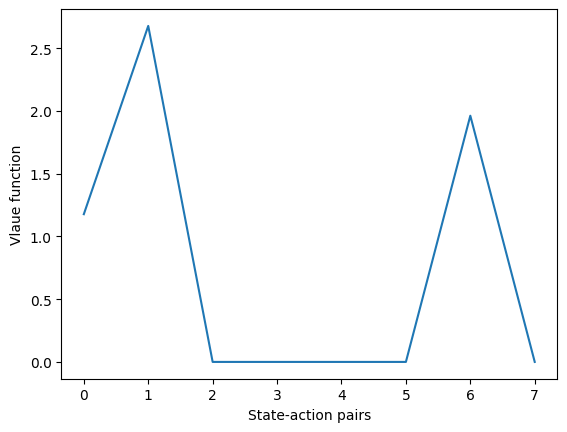

action =  1
next_state =  0
transition_prob =  0
reward =  5
Action Value: 0.0
Max Value: 1.9615781250000002
3 1
New Value: 0.0
next_state =  1
transition_prob =  0
reward =  5
Action Value: 0.0
Max Value: 1.9615781250000002
3 1
New Value: 0.0
next_state =  2
transition_prob =  0
reward =  5
Action Value: 0.0
Max Value: 1.9615781250000002
3 1
New Value: 0.0
next_state =  3
transition_prob =  0.5
reward =  5
Action Value: 4.461578125
Max Value: 4.461578125
3 1
New Value: 4.461578125
New Value Function: [[1.17694687 2.67694687]
 [0.         0.        ]
 [0.         0.        ]
 [1.96157813 4.46157812]]


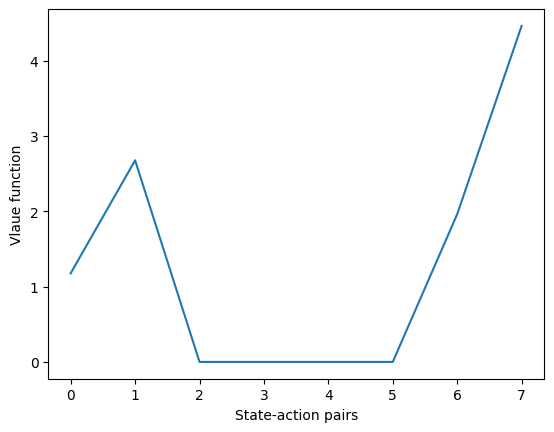

Optimal Value Function  [[1.17694687 2.67694687]
 [0.         0.        ]
 [0.         0.        ]
 [1.96157813 4.46157812]]


In [146]:
if __name__ == "__main__":
    main()

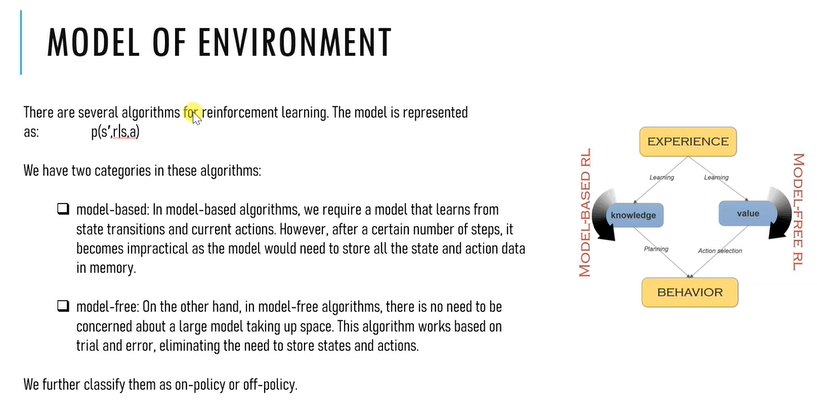

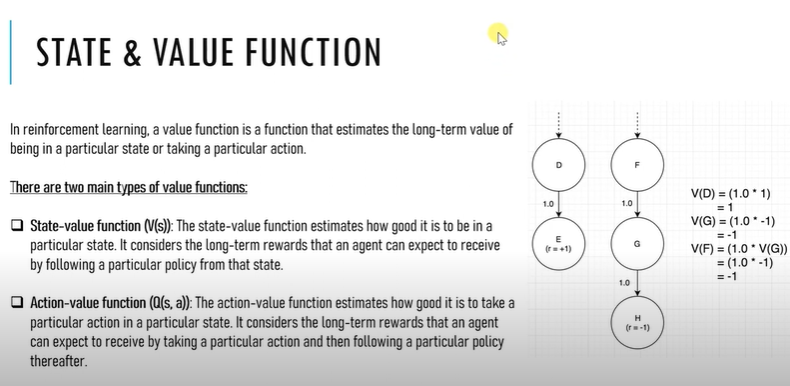

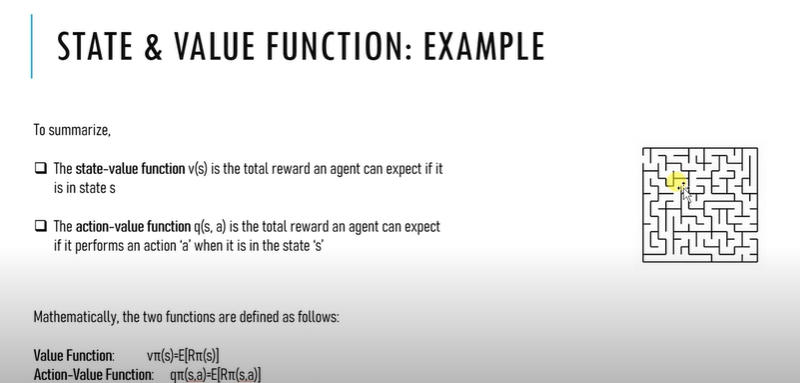

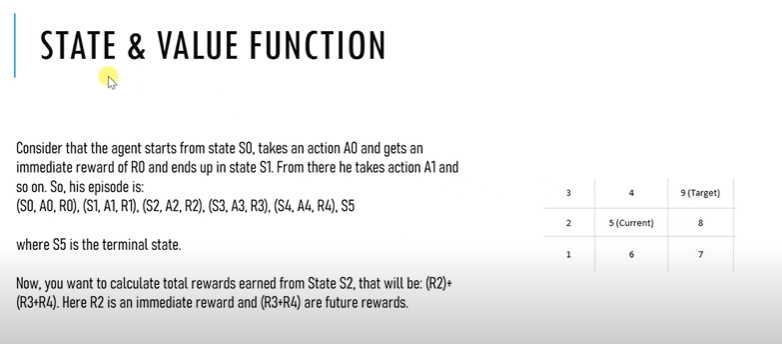

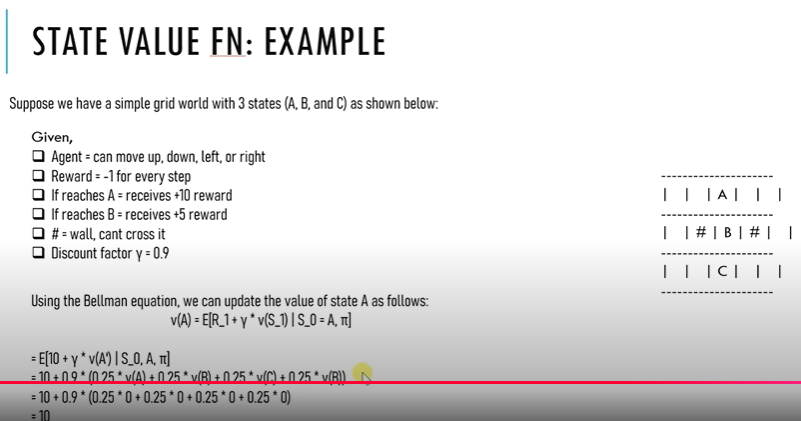

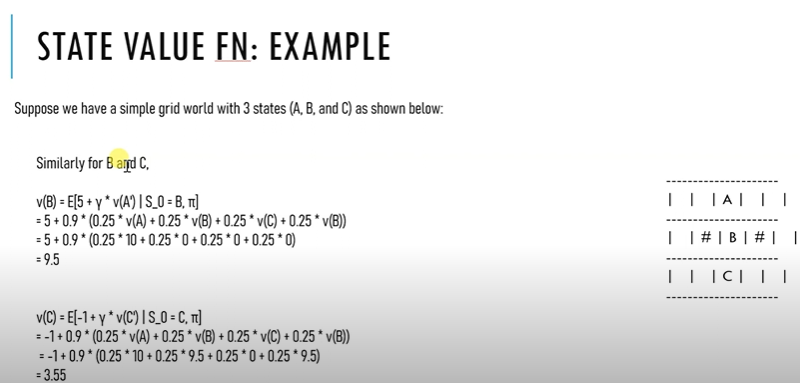

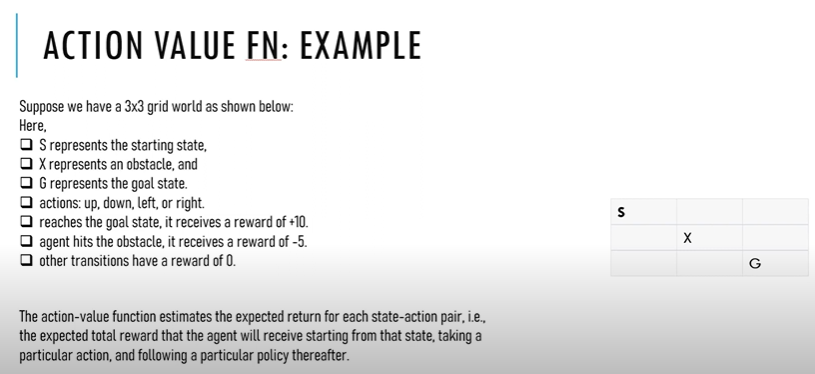

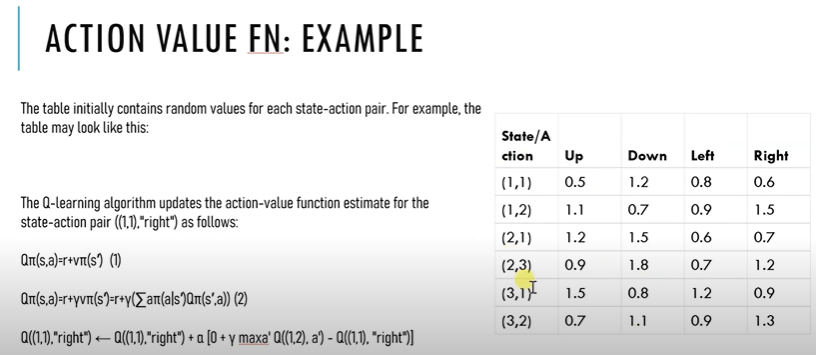


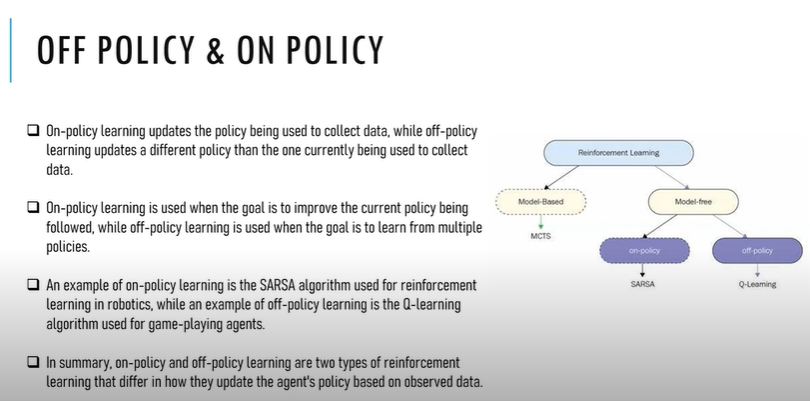

https://www.youtube.com/watch?v=j4MpCxuca2U&list=PL_Ke9hJMFeR9Kos7VtiPPiPp9Y16sA7Ef&index=23